In [16]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt 
import seaborn as sns 
%matplotlib inline
from ydata_profiling import ProfileReport
import plotly.express as px
import warnings
warnings.filterwarnings("ignore")

### Load Datasets

In [17]:
ODI_batting=pd.read_csv("ODI_batting.csv")
t20_batting=pd.read_csv("t20_batting.csv")
players=pd.read_csv("all_players.csv")
country=pd.read_csv("country.csv")

### Rename Columns for better understanding

In [18]:
ODI_batting.rename(columns = {'id':'player_id'}, inplace = True) 
t20_batting.rename(columns = {'id':'player_id'}, inplace = True) 
players.rename(columns = {'id':'player_id'}, inplace = True) 
country.rename(columns = {'id':'country_id'}, inplace = True) 

### Column Names

In [19]:
print(list(players.columns),"\n",list(country.columns),"\n",list(ODI_batting.columns),"\n",list(t20_batting.columns))

['player_id', 'name', 'gender', 'bating_style', 'bowling_style', 'playing_role', 'country_id'] 
 ['country_id', 'country'] 
 ['player_id', 'span', 'matches', 'innings', 'not_out', 'runs', 'high_score', 'average_score', 'ball_faced', 'strike_rate', '100s', '50', '0s', '4s', '6s'] 
 ['player_id', 'span', 'matches', 'innings', 'not_out', 'runs', 'high_score', 'average_score', 'ball_faced', 'strike_rate', '100s', '50', '0s', '4s', '6s']


### Merge Player details Country Data

In [20]:
players_data=pd.merge(players,country,on='country_id',how='left')


In [21]:
t20_batting.head()

,player_id,span,matches,innings,not_out,runs,high_score,average_score,ball_faced,strike_rate,100s,50,0s,4s,6s
0,420402,2013-2022,2,2.0,0.0,33.0,24,16.50,45.0,73.33,0.0,0.0,0.0,1.0,1.0
1,921509,2019-2022,16,16.0,3.0,381.0,64*,29.30,361.0,105.54,0.0,1.0,0.0,30.0,10.0
2,568136,2016-2022,22,3.0,3.0,27.0,24*,NaN,24.0,112.50,0.0,0.0,0.0,4.0,0.0
3,352048,2012-2022,55,45.0,13.0,615.0,56*,19.21,509.0,120.82,0.0,1.0,3.0,45.0,27.0
4,440970,2013-2022,6,4.0,2.0,48.0,36,24.00,55.0,87.27,0.0,0.0,0.0,5.0,0.0


In [22]:
players.head()

,player_id,name,gender,bating_style,bowling_style,playing_role,country_id
0,935995,Afif Hossain,M,left-hand bat,right-arm offbreak,allrounder,25
1,380354,Anamul Haque,M,right-hand bat,NaN,wicketkeeper batter,25
2,1346729,Dilara Akter,F,right-hand bat,NaN,wicketkeeper batter,25
3,932355,Ebadot Hossain,M,right-hand bat,right-arm fast-medium,bowler,25
4,627048,Fahima Khatun,F,right-hand bat,legbreak,bowler,25


In [23]:
country.head()

,country_id,country
0,40,Afghanistan
1,2,Australia
2,25,Bangladesh
3,1,England
4,6,India


### Map player details with stats for both ODI and T20I formats

In [24]:
ODI_data=pd.merge(players_data,ODI_batting,on='player_id')
t20_data=pd.merge(players_data,t20_batting,on='player_id')

In [25]:
t20_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 327 entries, 0 to 326
Data columns (total 22 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   player_id      327 non-null    int64  
 1   name           327 non-null    object 
 2   gender         327 non-null    object 
 3   bating_style   327 non-null    object 
 4   bowling_style  290 non-null    object 
 5   playing_role   327 non-null    object 
 6   country_id     327 non-null    int64  
 7   country        327 non-null    object 
 8   span           310 non-null    object 
 9   matches        327 non-null    int64  
 10  innings        317 non-null    float64
 11  not_out        317 non-null    float64
 12  runs           317 non-null    float64
 13  high_score     317 non-null    object 
 14  average_score  301 non-null    float64
 15  ball_faced     317 non-null    float64
 16  strike_rate    317 non-null    float64
 17  100s           317 non-null    float64
 18  50        

### Finding number of Nulls for various columns

In [26]:
t20_data.isna().sum()

player_id         0
name              0
gender            0
bating_style      0
bowling_style    37
playing_role      0
country_id        0
country           0
span             17
matches           0
innings          10
not_out          10
runs             10
high_score       10
average_score    26
ball_faced       10
strike_rate      10
100s             10
50               10
0s               10
4s               10
6s               10
dtype: int64

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

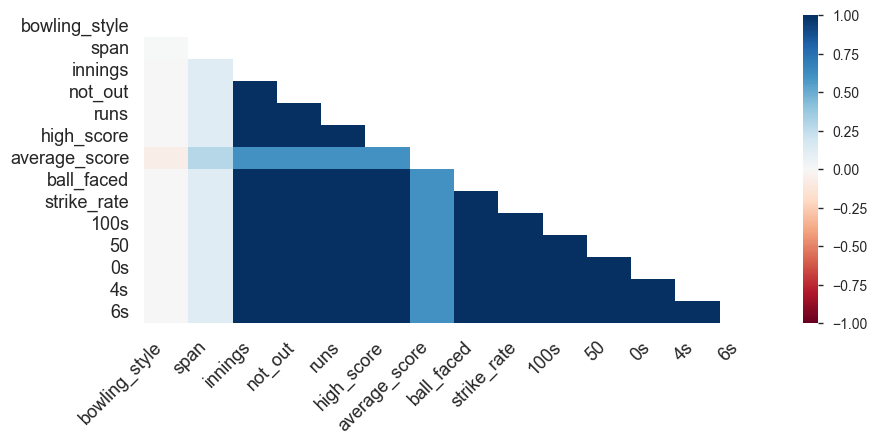

In [81]:
T20I_profile = ProfileReport(t20_data, title="Pandas Profiling Report")
T20I_profile

### Finding count of Infinite Values for all columns

In [28]:
t20_data[t20_data == np.inf].sum()

player_id        0.0
name               0
gender             0
bating_style       0
bowling_style      0
playing_role       0
country_id       0.0
country            0
span               0
matches          0.0
innings          0.0
not_out          0.0
runs             0.0
high_score         0
average_score    0.0
ball_faced       0.0
strike_rate      0.0
100s             0.0
50               0.0
0s               0.0
4s               0.0
6s               0.0
dtype: object

### Plotting player counts with innings counts

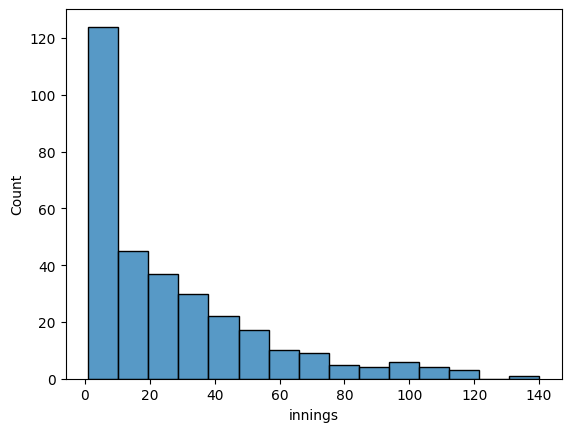

In [29]:

fig = sns.histplot(t20_data, x="innings")


### Set cut-off number for innings played 

In [30]:
data=t20_data[t20_data.innings>=20][['player_id','name','span','bating_style','playing_role','country','matches','innings','runs','strike_rate','average_score','not_out', '100s', '50','4s','6s']]

In [31]:
data.shape

(148, 16)

### Calculating Years played

In [32]:
def calc_playing_time(f):
    start=int(f[:4])
    end=int(f[-4:])
    if end==start:
        val=1
    else:
        val=end-start
    return (val)



In [33]:
data['years_played']=data['span'].apply(calc_playing_time)

### Calculating a new metric using harmonic mean of strike rate and batting average

In [34]:
data["batting_score"]=2/((1/data["strike_rate"])+(1/data["average_score"]))


### Create new columns based on Runs scored

In [35]:

data['Runs_per_year']=data['runs']/data['years_played']
data['Runs_per_inning']=data['runs']/data['innings']


data['Runs_by_6s']=data['6s']*6
data['6s_runs_percentage']=(data['Runs_by_6s']/data['runs'])*100
data['Runs_by_4s']=data['4s']*4
data['4s_runs_percentage']=(data['Runs_by_4s']/data['runs'])*100


In [36]:
data.head()

,player_id,name,span,bating_style,playing_role,country,matches,innings,runs,strike_rate,...,4s,6s,years_played,batting_score,Runs_per_year,Runs_per_inning,Runs_by_6s,6s_runs_percentage,Runs_by_4s,4s_runs_percentage
0,935995,Afif Hossain,2018-2022,left-hand bat,allrounder,Bangladesh,60,55.0,1003.0,120.55,...,72.0,33.0,4,36.261005,250.750000,18.236364,198.0,19.740778,288.0,28.713858
1,380354,Anamul Haque,2012-2022,right-hand bat,wicketkeeper batter,Bangladesh,20,20.0,445.0,112.65,...,46.0,14.0,10,40.543175,44.500000,22.250000,84.0,18.876404,184.0,41.348315
4,536936,Litton Das,2015-2022,right-hand bat,wicketkeeper batter,Bangladesh,65,64.0,1388.0,128.87,...,137.0,43.0,7,37.627649,198.285714,21.687500,258.0,18.587896,548.0,39.481268
5,833087,Mahedi Hasan,2018-2022,right-hand bat,allrounder,Bangladesh,38,28.0,259.0,104.85,...,18.0,9.0,4,22.065207,64.750000,9.250000,54.0,20.849421,72.0,27.799228
6,56025,Mahmudullah,2007-2022,right-hand bat,allrounder,Bangladesh,121,113.0,2122.0,117.30,...,161.0,64.0,15,39.252658,141.466667,18.778761,384.0,18.096136,644.0,30.348728


In [37]:
data.to_csv("ODI_Data.csv",index=False)

### Finding Numeric and Categorical Columns

In [38]:
numerical_features=data.select_dtypes(exclude="object").columns
categorical_features=data.select_dtypes(include="object").columns

### Outlier Analysis

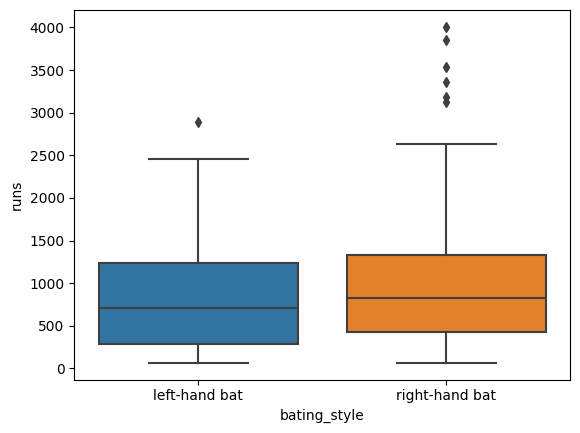

In [39]:
fig=sns.boxplot(x ='bating_style', y ="runs", data = data) 


In [40]:
z_score_df=pd.DataFrame()
for col in numerical_features:
    col_zscore = col + '_zscore'
    z_score_df[col_zscore] = (data[col] - data[col].mean())/data[col].std(ddof=0)

In [41]:
z_score_df

,player_id_zscore,matches_zscore,innings_zscore,runs_zscore,strike_rate_zscore,average_score_zscore,not_out_zscore,100s_zscore,50_zscore,4s_zscore,6s_zscore,years_played_zscore,batting_score_zscore,Runs_per_year_zscore,Runs_per_inning_zscore,Runs_by_6s_zscore,6s_runs_percentage_zscore,Runs_by_4s_zscore,4s_runs_percentage_zscore
0,1.812278,0.038184,0.247526,0.024009,-0.243259,-0.129493,-0.204896,-0.378114,-0.315535,-0.166764,-0.123865,-0.952145,-0.102404,0.867339,0.017983,-0.123865,-0.330754,-0.166764,-0.494062
1,-0.258435,-1.489174,-1.126735,-0.660402,-0.715238,0.259773,-1.114632,-0.378114,-0.619764,-0.496521,-0.687470,0.631198,0.233875,-0.869899,0.519384,-0.687470,-0.428627,-0.496521,1.204912
4,0.325101,0.229104,0.600908,0.496227,0.253812,-0.050028,-1.266255,-0.378114,0.445038,0.657629,0.172769,-0.160474,0.004918,0.425434,0.449114,0.172769,-0.461294,0.657629,0.953848
5,1.428770,-0.801863,-0.812618,-0.888539,-1.181242,-1.167151,-0.356518,-0.378114,-0.771878,-0.851645,-0.835787,-0.952145,-1.217201,-0.699333,-1.104633,-0.835787,-0.205224,-0.851645,-0.617054
6,-1.467115,2.367404,2.524874,1.396509,-0.437428,0.127330,2.069446,-0.378114,0.140809,0.962021,0.795701,1.950650,0.132531,-0.053151,0.085741,0.795701,-0.516976,0.962021,-0.274219
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
311,-0.553285,-1.260070,-1.126735,-0.849289,-0.934499,-0.726060,-1.114632,-0.378114,-0.771878,-0.737498,-0.954440,-0.952145,-0.739649,-0.631950,-0.442534,-0.954440,-1.398675,-0.737498,0.635437
313,-0.827108,0.076368,-0.262914,-0.202902,0.038135,0.552298,0.401596,-0.378114,-0.315535,-0.077983,-0.657806,0.895088,0.566248,-0.618358,0.172867,-0.657806,-1.320188,-0.077983,0.839485
314,1.763637,0.954598,-0.419972,-0.622379,1.145791,-0.394378,0.553218,-0.378114,-0.619764,-0.724815,-0.272182,-0.688255,-0.309213,-0.442854,-0.695342,-0.272182,1.430337,-0.724815,-1.191223
321,-0.487661,-1.260070,-0.969677,-0.348860,1.875864,1.648691,-0.659764,2.567196,-0.315535,-0.293594,-0.094201,0.103417,1.724687,-0.508764,1.378239,-0.094201,0.738556,-0.293594,0.415691


In [42]:
IQR = data['runs'].quantile(0.75)-data['runs'].quantile(0.25)


In [43]:
upper_boundary = data['runs'].quantile(0.75) + (IQR * 1.5)
lower_boundary = data['runs'].quantile(0.25) + (IQR * 1.5)
print(upper_boundary)
print(lower_boundary)


2743.625
1801.375


In [44]:

data[data['runs']>upper_boundary].sort_values('runs',ascending=False)


,player_id,name,span,bating_style,playing_role,country,matches,innings,runs,strike_rate,...,4s,6s,years_played,batting_score,Runs_per_year,Runs_per_inning,Runs_by_6s,6s_runs_percentage,Runs_by_4s,4s_runs_percentage
192,253802,V Kohli,2010-2022,right-hand bat,top-order batter,India,115,107.0,4008.0,137.96,...,356.0,117.0,12,76.297979,334.000000,37.457944,702.0,17.514970,1424.0,35.528942
261,34102,RG Sharma,2007-2022,right-hand bat,top-order batter,India,148,140.0,3853.0,139.24,...,348.0,182.0,15,51.137392,256.866667,27.521429,1092.0,28.341552,1392.0,36.127693
51,226492,MJ Guptill,2009-2022,right-hand bat,opening batter,New Zealand,122,118.0,3531.0,135.70,...,309.0,173.0,13,51.538619,271.615385,29.923729,1038.0,29.396771,1236.0,35.004248
161,348144,Babar Azam,2016-2022,right-hand bat,batter,Pakistan,99,94.0,3355.0,127.80,...,355.0,50.0,6,62.551835,559.166667,35.691489,300.0,8.941878,1420.0,42.324888
75,303427,PR Stirling,2009-2022,right-hand bat,batting allrounder,Ireland,121,120.0,3181.0,134.78,...,360.0,117.0,13,47.255057,244.692308,26.508333,702.0,22.068532,1440.0,45.268783
147,5334,AJ Finch,2011-2022,right-hand bat,top-order batter,Australia,103,103.0,3120.0,142.53,...,309.0,125.0,11,55.267557,283.636364,30.291262,750.0,24.038462,1236.0,39.615385
304,219889,DA Warner,2009-2022,left-hand bat,opening batter,Australia,99,99.0,2894.0,141.30,...,295.0,105.0,13,53.346469,222.615385,29.232323,630.0,21.769178,1180.0,40.774015


In [45]:
data[data['runs']<lower_boundary].sort_values('runs',ascending=True)


,player_id,name,span,bating_style,playing_role,country,matches,innings,runs,strike_rate,...,4s,6s,years_played,batting_score,Runs_per_year,Runs_per_inning,Runs_by_6s,6s_runs_percentage,Runs_by_4s,4s_runs_percentage
194,326016,B Kumar,2012-2022,right-hand bat,bowler,India,87,21.0,67.0,71.27,...,0.0,0.0,10,14.980660,6.700000,3.190476,0.0,0.000000,0.0,0.000000
13,330902,Mustafizur Rahman,2015-2022,left-hand bat,bowler,Bangladesh,78,24.0,68.0,76.40,...,3.0,4.0,7,8.552873,9.714286,2.833333,24.0,35.294118,12.0,17.647059
70,928067,JB Little,2016-2022,right-hand bat,bowler,Ireland,53,25.0,86.0,78.89,...,7.0,2.0,6,14.212939,14.333333,3.440000,12.0,13.953488,28.0,32.558140
108,571703,WP Masakadza,2015-2023,left-hand bat,bowler,Zimbabwe,39,20.0,87.0,81.30,...,6.0,0.0,8,12.362700,10.875000,4.350000,0.0,0.000000,24.0,27.586207
202,244497,AU Rashid,2009-2022,right-hand bat,bowler,England,92,29.0,91.0,85.84,...,7.0,0.0,13,12.084904,7.000000,3.137931,0.0,0.000000,28.0,30.769231
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
267,446507,SA Yadav,2021-2023,right-hand bat,batter,India,48,46.0,1675.0,175.76,...,150.0,96.0,2,73.568069,837.500000,36.413043,576.0,34.388060,600.0,35.820896
28,25913,Mohammad Nabi,2010-2022,right-hand bat,allrounder,Afghanistan,104,96.0,1686.0,140.03,...,114.0,89.0,12,36.628580,140.500000,17.562500,534.0,31.672598,456.0,27.046263
199,236489,DJ Malan,2017-2022,left-hand bat,top-order batter,England,55,53.0,1748.0,135.71,...,178.0,58.0,5,60.395032,349.600000,32.981132,348.0,19.908467,712.0,40.732265
136,56194,Tamim Iqbal,2007-2020,left-hand bat,opening batter,Bangladesh,78,78.0,1758.0,116.96,...,188.0,45.0,13,39.937561,135.230769,22.538462,270.0,15.358362,752.0,42.775882


### Runs Destribution Across Nationalities

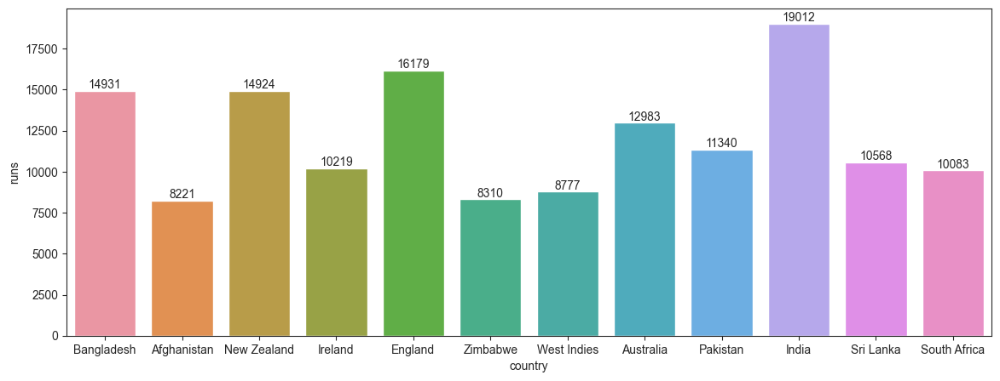

In [46]:
sns.set_style('ticks')
plt.figure(figsize =(14, 5))
g=sns.barplot(data,x='country',y='runs',estimator=sum,errorbar=None)
for i in g.containers:
    g.bar_label(i,)

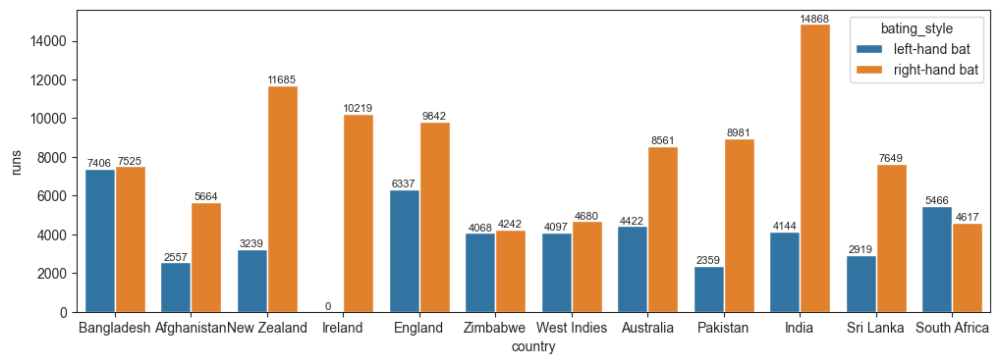

In [47]:
sns.set_style('ticks')
plt.figure(figsize =(12, 4))
g=sns.barplot(data,x='country',y='runs',hue='bating_style',estimator=sum,errorbar=None)
for i in g.containers:
    g.bar_label(i,fontsize=8)

### Runs Destribution Across Playing role

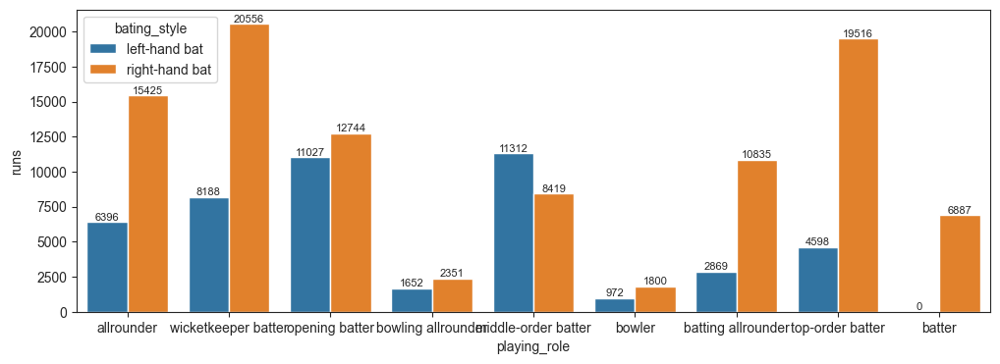

In [48]:
sns.set_style('ticks')
plt.figure(figsize =(12, 4))
g=sns.barplot(data,x='playing_role',y='runs',hue='bating_style',estimator=sum,errorbar=None)
for i in g.containers:
    g.bar_label(i,fontsize=8)

In [49]:
pivot_table=pd.pivot_table(data=data,index=['bating_style','playing_role'],aggfunc={'runs' : 'sum', 'average_score' : 'mean','player_id':'count'})

In [50]:
pivot_table.reset_index(inplace=True)

In [51]:
pivot_table

,bating_style,playing_role,average_score,player_id,runs
0,left-hand bat,allrounder,19.855000,8,6396.0
1,left-hand bat,batting allrounder,22.662500,4,2869.0
2,left-hand bat,bowler,11.648571,7,972.0
3,left-hand bat,bowling allrounder,15.696667,6,1652.0
4,left-hand bat,middle-order batter,25.645000,8,11312.0
5,left-hand bat,opening batter,27.380000,7,11027.0
6,left-hand bat,top-order batter,26.203333,6,4598.0
7,left-hand bat,wicketkeeper batter,25.657500,8,8188.0
8,right-hand bat,allrounder,20.646471,17,15425.0
9,right-hand bat,batter,36.950000,3,6887.0


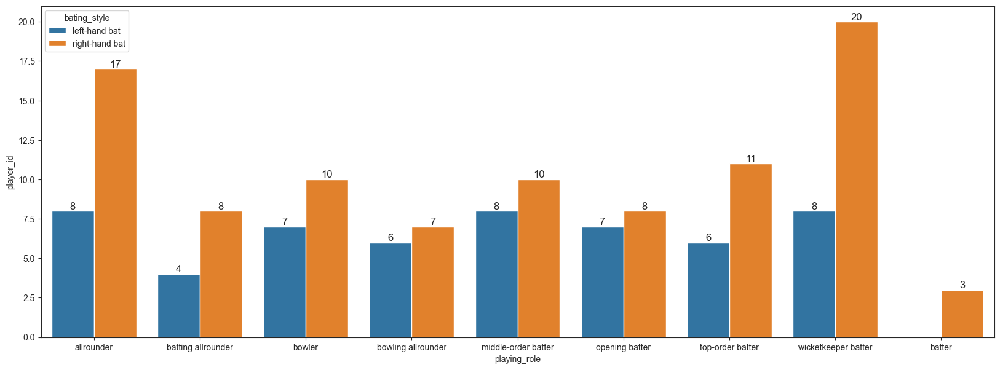

In [52]:
sns.set_style('ticks')
plt.figure(figsize =(20, 7))
g=sns.barplot(pivot_table,x='playing_role',y='player_id',hue='bating_style',errorbar=None)
for i in g.containers:
    g.bar_label(i,fontsize=12)

### Distribution of Strike rate, batitng_average and batting_score

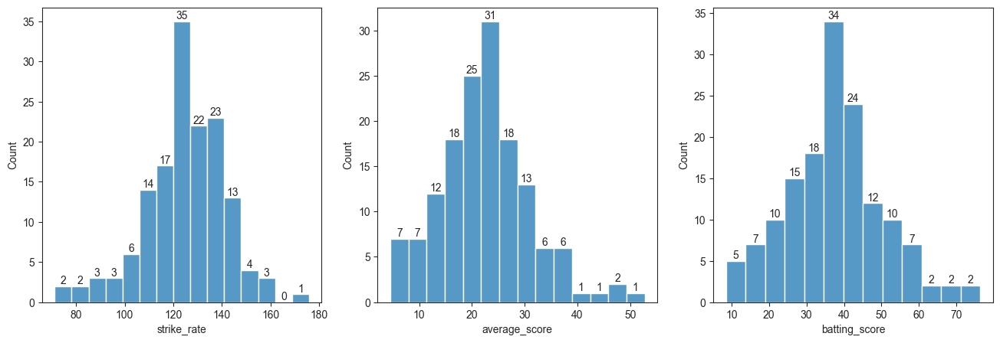

In [53]:
fig, axs = plt.subplots(ncols=3,figsize=(16, 5))

g1=sns.histplot(x='strike_rate', data=data, ax=axs[0])
for i in g1.containers:
    g1.bar_label(i,)
g2=sns.histplot(x='average_score', data=data, ax=axs[1])
for i in g2.containers:
    g2.bar_label(i,)
g3=sns.histplot(x='batting_score', data=data, ax=axs[2])
for i in g3.containers:
    g3.bar_label(i,)


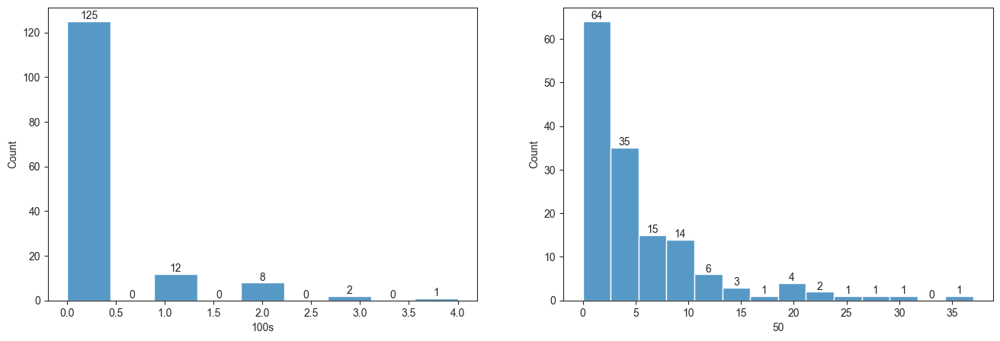

In [54]:
fig, axs = plt.subplots(ncols=2,figsize=(16, 5))

g1=sns.histplot(x='100s', data=data, ax=axs[0])
for i in g1.containers:
    g1.bar_label(i,)
g2=sns.histplot(x='50', data=data, ax=axs[1])
for i in g2.containers:
    g2.bar_label(i,)



In [55]:
data.playing_role.value_counts().index

Index(['wicketkeeper batter', 'allrounder', 'middle-order batter', 'bowler',
       'top-order batter', 'opening batter', 'bowling allrounder',
       'batting allrounder', 'batter'],
      dtype='object', name='playing_role')

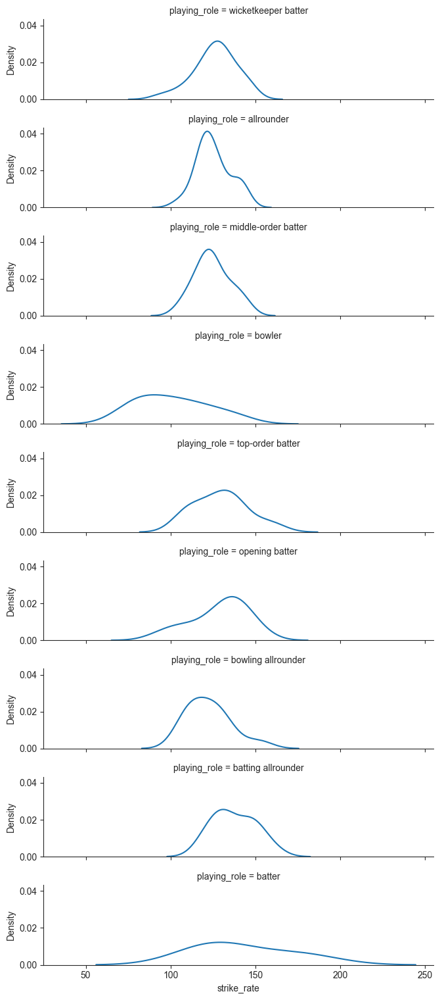

In [56]:
cats = data.playing_role.value_counts().index
sea = sns.FacetGrid(data, row = "playing_role", 
                    row_order = cats,
                    height = 1.7, aspect = 4)
 
sea.map(sns.kdeplot, "strike_rate")

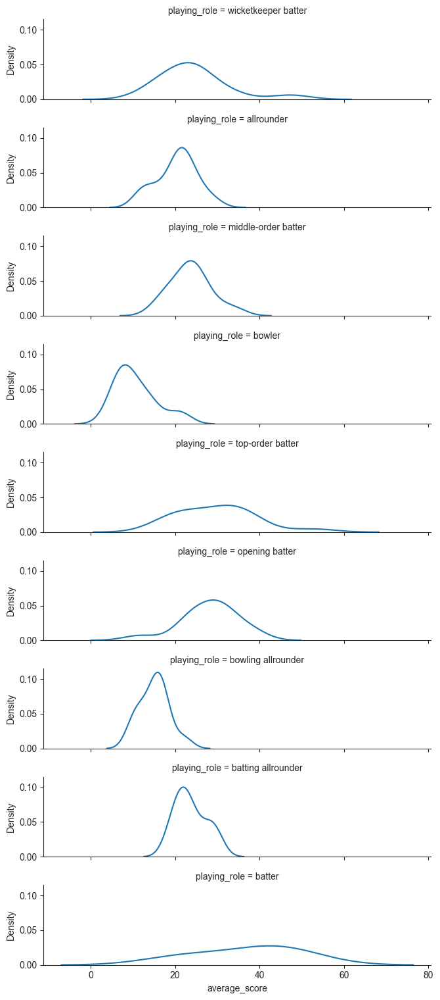

In [57]:
cats = data.playing_role.value_counts().index
sea = sns.FacetGrid(data, row = "playing_role", 
                    row_order = cats,
                    height = 1.7, aspect = 4)
 
sea.map(sns.kdeplot, "average_score")

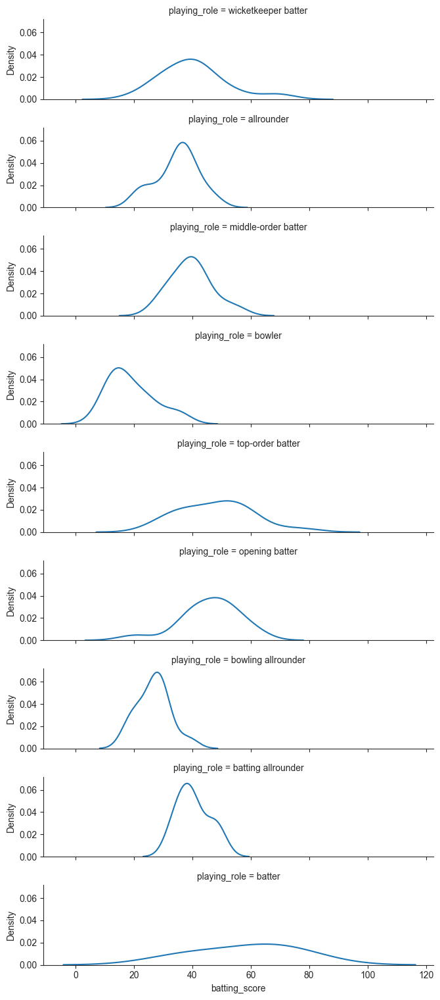

In [58]:
cats = data.playing_role.value_counts().index
sea = sns.FacetGrid(data, row = "playing_role", 
                    row_order = cats,
                    height = 1.7, aspect = 4)
 
sea.map(sns.kdeplot, "batting_score")

### Performance analysis with time played

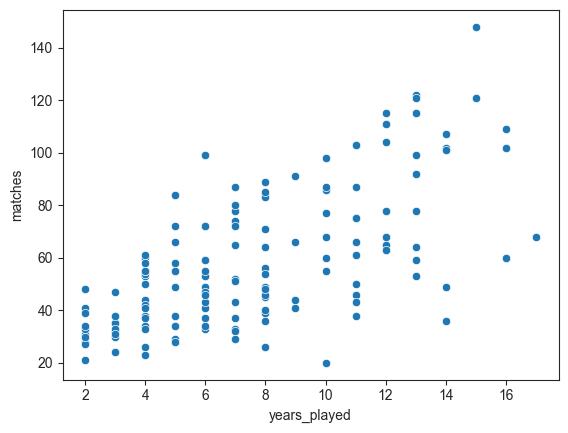

In [59]:
g=sns.scatterplot(data=data,x="years_played",y="matches")

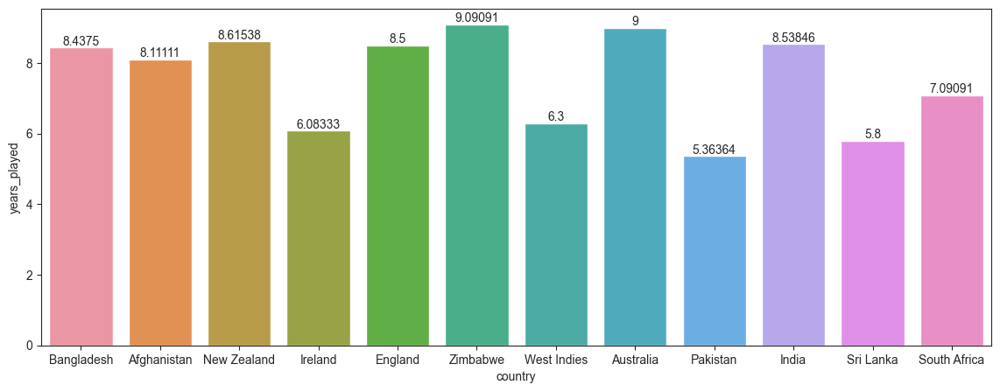

In [60]:
sns.set_style('ticks')
plt.figure(figsize =(14, 5))
g=sns.barplot(data,x='country',y='years_played',estimator=np.mean,errorbar=None)
for i in g.containers:
    g.bar_label(i,)

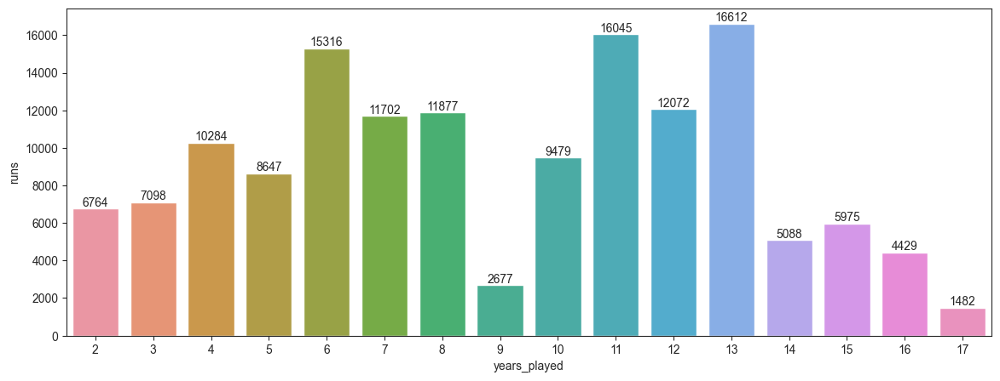

In [61]:
sns.set_style('ticks')
plt.figure(figsize =(14, 5))
g=sns.barplot(data,x='years_played',y='runs',estimator=sum,errorbar=None)
for i in g.containers:
    g.bar_label(i,)

In [62]:
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt


In [63]:
data.head()

,player_id,name,span,bating_style,playing_role,country,matches,innings,runs,strike_rate,...,4s,6s,years_played,batting_score,Runs_per_year,Runs_per_inning,Runs_by_6s,6s_runs_percentage,Runs_by_4s,4s_runs_percentage
0,935995,Afif Hossain,2018-2022,left-hand bat,allrounder,Bangladesh,60,55.0,1003.0,120.55,...,72.0,33.0,4,36.261005,250.750000,18.236364,198.0,19.740778,288.0,28.713858
1,380354,Anamul Haque,2012-2022,right-hand bat,wicketkeeper batter,Bangladesh,20,20.0,445.0,112.65,...,46.0,14.0,10,40.543175,44.500000,22.250000,84.0,18.876404,184.0,41.348315
4,536936,Litton Das,2015-2022,right-hand bat,wicketkeeper batter,Bangladesh,65,64.0,1388.0,128.87,...,137.0,43.0,7,37.627649,198.285714,21.687500,258.0,18.587896,548.0,39.481268
5,833087,Mahedi Hasan,2018-2022,right-hand bat,allrounder,Bangladesh,38,28.0,259.0,104.85,...,18.0,9.0,4,22.065207,64.750000,9.250000,54.0,20.849421,72.0,27.799228
6,56025,Mahmudullah,2007-2022,right-hand bat,allrounder,Bangladesh,121,113.0,2122.0,117.30,...,161.0,64.0,15,39.252658,141.466667,18.778761,384.0,18.096136,644.0,30.348728


In [64]:
clust_data=data[numerical_features]

In [65]:
scaler = StandardScaler()
scaled_data = scaler.fit_transform(clust_data)

In [66]:
inertia = []
for n_clusters in range(1, 11):
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    kmeans.fit(scaled_data)
    inertia.append(kmeans.inertia_)

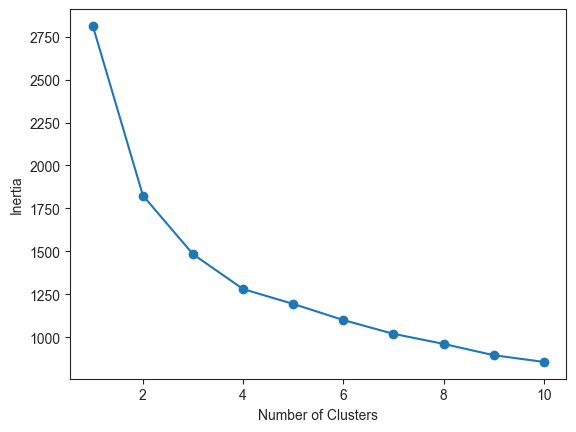

In [67]:
plt.plot(range(1, 11), inertia, marker='o')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.show()

In [68]:
n_clusters = 3

In [69]:
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
clusters = kmeans.fit_predict(scaled_data)
clust_data['cluster'] = clusters


In [70]:
cluster_centers = scaler.inverse_transform(kmeans.cluster_centers_)
centroid_df = pd.DataFrame(cluster_centers, columns=clust_data.columns[:-1]) 

In [71]:
print("Cluster Centroids:")
centroid_df

Cluster Centroids:


,player_id,matches,innings,runs,strike_rate,average_score,not_out,100s,50,4s,6s,years_played,batting_score,Runs_per_year,Runs_per_inning,Runs_by_6s,6s_runs_percentage,Runs_by_4s,4s_runs_percentage
0,487770.869565,51.550725,47.057971,979.739130,127.469855,24.863333,6.637681,0.115942,4.884058,86.956522,34.927536,7.043478,41.409345,176.529537,21.260730,209.565217,21.533681,347.826087,35.534571
1,242810.200000,96.160000,90.520000,2436.360000,137.575600,33.118000,15.120000,1.160000,15.880000,216.640000,96.080000,10.720000,52.979755,265.438210,27.386354,576.480000,24.710555,866.560000,34.726274
2,496837.944444,51.314815,31.425926,315.481481,114.985185,14.466852,10.148148,0.018519,0.314815,21.962963,12.777778,6.888889,25.516370,56.564639,9.741267,76.666667,23.155023,87.851852,27.284745


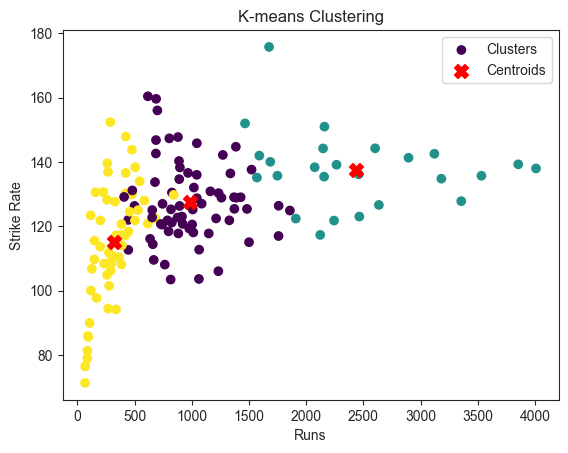

In [72]:
plt.scatter(clust_data['runs'], clust_data['strike_rate'], c=clust_data['cluster'], cmap='viridis',label='Clusters',)
plt.scatter(centroid_df['runs'], centroid_df['strike_rate'], marker='X', s=100, c='red', label='Centroids')
plt.xlabel('Runs')
plt.ylabel('Strike Rate')
plt.title('K-means Clustering')
plt.legend()
plt.show()

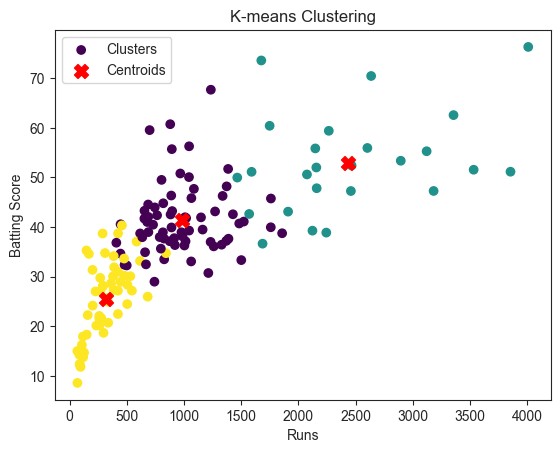

In [73]:
plt.scatter(clust_data['runs'], clust_data['batting_score'], c=clust_data['cluster'], cmap='viridis',label='Clusters',)
plt.scatter(centroid_df['runs'], centroid_df['batting_score'], marker='X', s=100, c='red', label='Centroids')
plt.xlabel('Runs')
plt.ylabel('Batting Score')
plt.title('K-means Clustering')
plt.legend()
plt.show()

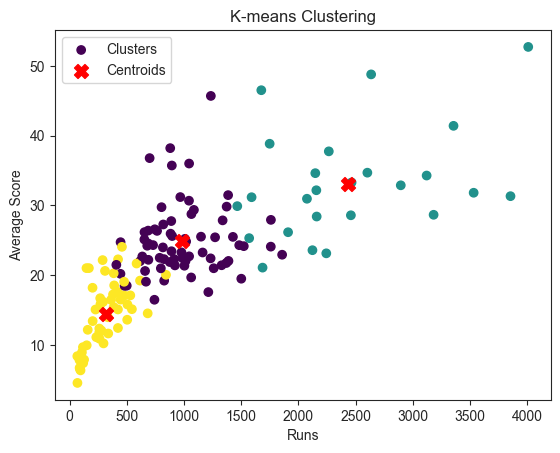

In [74]:
plt.scatter(clust_data['runs'], clust_data['average_score'], c=clust_data['cluster'], cmap='viridis',label='Clusters')
plt.scatter(centroid_df['runs'], centroid_df['average_score'], marker='X', s=100, c='red', label='Centroids')
plt.xlabel('Runs')
plt.ylabel('Average Score')
plt.title('K-means Clustering')
plt.legend()
plt.show()

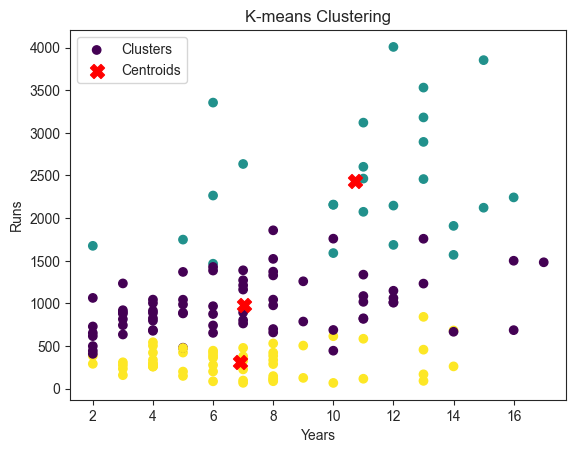

In [75]:
plt.scatter(clust_data['years_played'], clust_data['runs'], c=clust_data['cluster'], cmap='viridis',label='Clusters')
plt.scatter(centroid_df['years_played'], centroid_df['runs'], marker='X', s=100, c='red', label='Centroids')
plt.xlabel('Years')
plt.ylabel('Runs')
plt.title('K-means Clustering')
plt.legend()
plt.show()

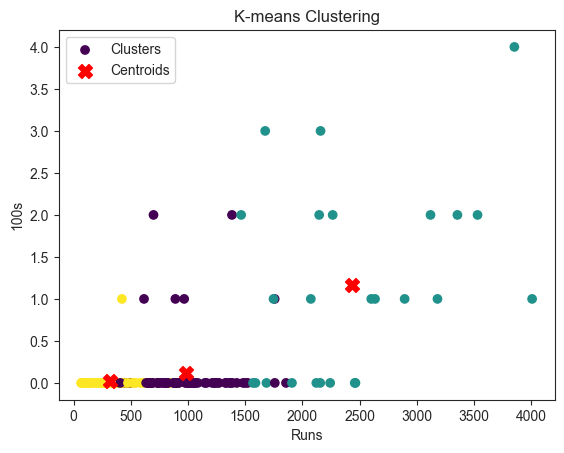

In [76]:
plt.scatter(clust_data['runs'], clust_data['100s'], c=clust_data['cluster'], cmap='viridis',label='Clusters')
plt.scatter(centroid_df['runs'], centroid_df['100s'], marker='X', s=100, c='red', label='Centroids')
plt.xlabel('Runs')
plt.ylabel('100s')
plt.title('K-means Clustering')
plt.legend()
plt.show()

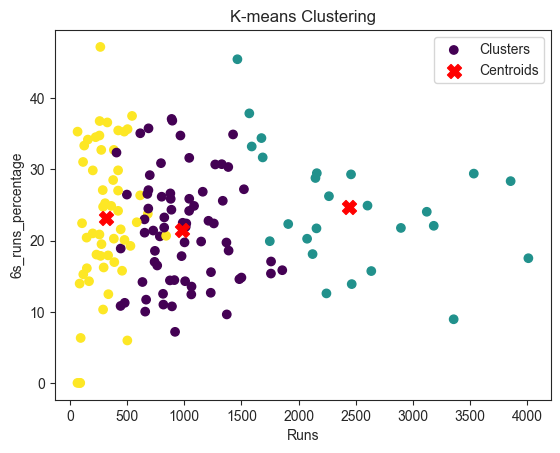

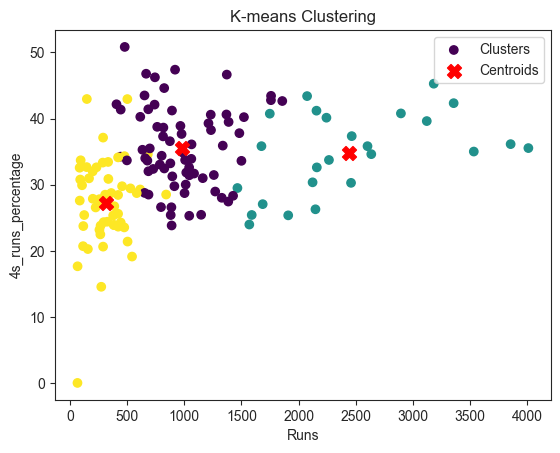

In [77]:

plt.scatter(clust_data['runs'], clust_data['6s_runs_percentage'], c=clust_data['cluster'], cmap='viridis',label='Clusters')
plt.scatter(centroid_df['runs'], centroid_df['6s_runs_percentage'], marker='X', s=100, c='red', label='Centroids')
plt.xlabel('Runs')
plt.ylabel('6s_runs_percentage')
plt.title('K-means Clustering')
plt.legend()
plt.show()
plt.scatter(clust_data['runs'], clust_data['4s_runs_percentage'], c=clust_data['cluster'], cmap='viridis',label='Clusters')
plt.scatter(centroid_df['runs'], centroid_df['4s_runs_percentage'], marker='X', s=100, c='red', label='Centroids')
plt.xlabel('Runs')
plt.ylabel('4s_runs_percentage')
plt.title('K-means Clustering')
plt.legend()
plt.show()

Overall Silhouette Score: 0.21589283428261424


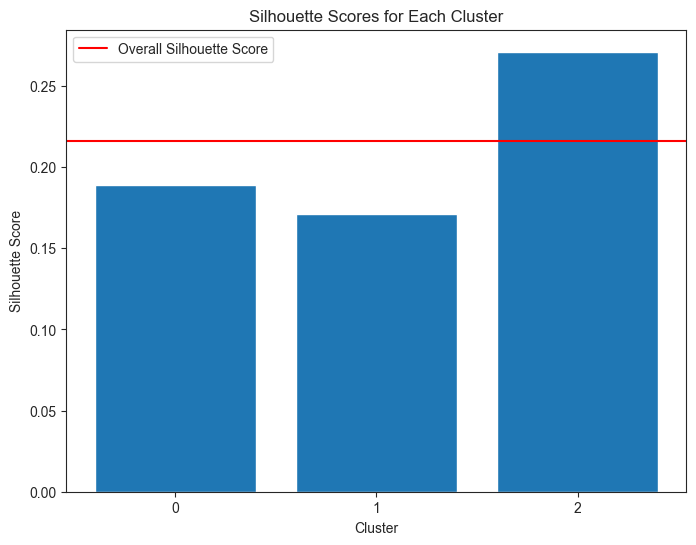

In [79]:
from sklearn.metrics import silhouette_score, silhouette_samples
import matplotlib.pyplot as plt
import numpy as np



silhouette_scores = silhouette_samples(scaled_data, clusters)

overall_silhouette_score = silhouette_score(scaled_data, clusters)


print("Overall Silhouette Score:", overall_silhouette_score)


cluster_silhouette_scores = []
for cluster in np.unique(clusters):
    cluster_silhouette_avg = np.mean(silhouette_scores[clusters == cluster])
    cluster_silhouette_scores.append(cluster_silhouette_avg)


plt.figure(figsize=(8, 6))
plt.bar(range(len(cluster_silhouette_scores)), cluster_silhouette_scores)
plt.xlabel('Cluster')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Scores for Each Cluster')
plt.xticks(range(len(cluster_silhouette_scores)))
plt.axhline(y=overall_silhouette_score, color="red", linestyle="-", label='Overall Silhouette Score')
plt.legend()
plt.show()

In [80]:
cluster_silhouette_scores

[0.1889806941458778, 0.1709200723963608, 0.2711012919972652]